# libraries

In [309]:
!pip install plotly
!pip install missingno
!pip install visualizer
!pip install fancyimpute
import warnings
warnings.filterwarnings("ignore")
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import gridspec
import plotly.express as px
from pandas import plotting
import missingno as ms
from sklearn.impute import SimpleImputer
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from visualizer import Visualizer
from fancyimpute import KNN
from sklearn.preprocessing import OrdinalEncoder
from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import StandardScaler
from itertools import product
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split

In [310]:
plt.style.use("ggplot")

# import dataset

In [312]:


df = pd.read_csv("Data_Science_Internship - Dump.csv")


In [313]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46608 entries, 0 to 46607
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Unnamed: 0      46608 non-null  int64 
 1   Agent_id        46608 non-null  object
 2   status          46608 non-null  object
 3   lost_reason     43244 non-null  object
 4   budget          42908 non-null  object
 5   lease           44267 non-null  object
 6   movein          32970 non-null  object
 7   source          46608 non-null  object
 8   source_city     46608 non-null  object
 9   source_country  46608 non-null  object
 10  utm_source      46608 non-null  object
 11  utm_medium      46608 non-null  object
 12  des_city        46608 non-null  object
 13  des_country     46608 non-null  object
 14  room_type       23061 non-null  object
 15  lead_id         46608 non-null  object
dtypes: int64(1), object(15)
memory usage: 5.7+ MB


Text(0.5, 1.0, 'Null Values Plot')

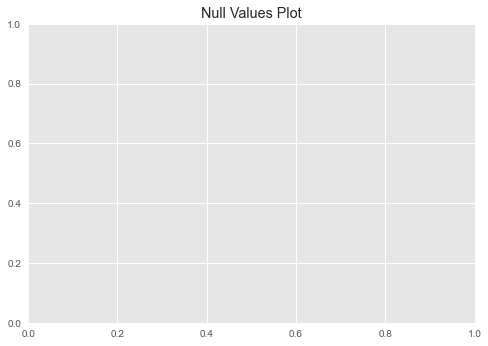

In [314]:
plt.title("Null Values Plot")

<AxesSubplot:>

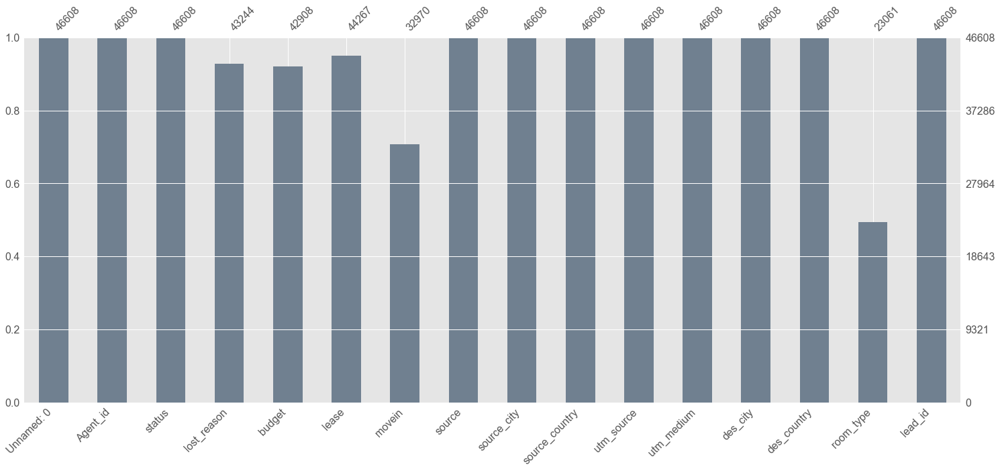

In [315]:
ms.bar(df, color = 'slategrey')

In [316]:
df.shape

(46608, 16)

In [317]:
(df.isnull().sum()/df.shape[0]*100).sort_values(ascending = False)

room_type         50.521370
movein            29.261071
budget             7.938551
lost_reason        7.217645
lease              5.022743
Unnamed: 0         0.000000
Agent_id           0.000000
status             0.000000
source             0.000000
source_city        0.000000
source_country     0.000000
utm_source         0.000000
utm_medium         0.000000
des_city           0.000000
des_country        0.000000
lead_id            0.000000
dtype: float64

# Data Preprocessing & Visualisation

In [318]:

num_col = df.dtypes[(df.dtypes == 'int64') | (df.dtypes == 'float64')].keys()
num_col

Index(['Unnamed: 0'], dtype='object')

In [319]:
cat_col = df.dtypes[~(df.dtypes == 'int64') & ~(df.dtypes == 'float64')].keys()
cat_col

Index(['Agent_id', 'status', 'lost_reason', 'budget', 'lease', 'movein',
       'source', 'source_city', 'source_country', 'utm_source', 'utm_medium',
       'des_city', 'des_country', 'room_type', 'lead_id'],
      dtype='object')

In [320]:

num_df = df[num_col]


In [321]:
cat_df = df[cat_col]

In [322]:
num_df

,Unnamed: 0
0,0
1,1
2,2
3,3
4,4
...,...
46603,46603
46604,46604
46605,46605
46606,46606


In [323]:
(num_df.isnull().sum()/num_df.shape[0]*100).sort_values(ascending = False)

Unnamed: 0    0.0
dtype: float64

In [324]:
se_median = SimpleImputer(missing_values = np.nan, strategy='most_frequent')
se_median

SimpleImputer(add_indicator=False, copy=True, fill_value=None,
              keep_empty_features=False, missing_values=nan,
              strategy='most_frequent', verbose='deprecated')

In [325]:
num_df.columns

Index(['Unnamed: 0'], dtype='object')

In [326]:
df.columns

Index(['Unnamed: 0', 'Agent_id', 'status', 'lost_reason', 'budget', 'lease',
       'movein', 'source', 'source_city', 'source_country', 'utm_source',
       'utm_medium', 'des_city', 'des_country', 'room_type', 'lead_id'],
      dtype='object')

In [327]:
cat_df[['lost_reason', 'lease','room_type','budget','movein']] = se_median.fit_transform(cat_df[['lost_reason', 'lease','room_type','budget','movein']])
cat_df

,Agent_id,status,lost_reason,budget,lease,movein,source,source_city,source_country,utm_source,utm_medium,des_city,des_country,room_type,lead_id
0,1deba9e96f404694373de9749ddd1ca8aa7bb823145a6f...,LOST,Not responding,£60 - £120 Per week,Full Year Course Stay 40 - 44 weeks,10/09/22,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,3d59f7548e1af2151b64135003ce63c0a484c26b9b8b16...,268ad70eb5bc4737a2ae28162cbca30118cc94520e49ef...,ecc0e7dc084f141b29479058967d0bc07dee25d9690a98...,8d23a6e37e0a6431a8f1b43a91026dcff51170a89a6512...,Ensuite,cd5dc0d9393f3980d11d4ba6f88f8110c2b7a7f7796307...
1,299ae77a4ef350ae0dd37d6bba1c002d03444fb1edb236...,LOST,Low budget,£60 - £120 Per week,Full Year Course Stay 40 - 44 weeks,10/09/22,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,3d59f7548e1af2151b64135003ce63c0a484c26b9b8b16...,268ad70eb5bc4737a2ae28162cbca30118cc94520e49ef...,5372372f3bf5896820cb2819300c3e681820d82c6efc54...,8d23a6e37e0a6431a8f1b43a91026dcff51170a89a6512...,Ensuite,b94693673a5f7178d1b114e4004ad52377d3244dd24a3d...
2,c213697430c006013012dd2aca82dd9732aa0a1a6bca13...,LOST,Not responding,£121 - £180 Per Week,Full Year Course Stay 40 - 44 weeks,31/08/22,7aae3e886e89fc1187a5c47d6cea1c22998ee610ade1f2...,9b8cc3c63cdf447e463c11544924bf027945cbd29675f7...,e09e10e67812e9d236ad900e5d46b4308fc62f5d69446a...,bbdefa2950f49882f295b1285d4fa9dec45fc4144bfb07...,09076eb7665d1fb9389c7c4517fee0b00e43092eb34821...,11ab03a1a8c367191355c152f39fe28cae5e426fce49ef...,8d23a6e37e0a6431a8f1b43a91026dcff51170a89a6512...,Ensuite,96ea4e2bf04496c044745938c0299c264c3f4ba079e572...
3,eac9815a500f908736d303e23aa227f0957177b0e6756b...,LOST,Low budget,0-0,0,10/09/22,ba2d0a29556ac20f86f45e4543c0825428cba33fd7a9ea...,a5f0d2d08eb0592087e3a3a2f9c1ba2c67cc30f2efd2bd...,e09e10e67812e9d236ad900e5d46b4308fc62f5d69446a...,bbdefa2950f49882f295b1285d4fa9dec45fc4144bfb07...,09076eb7665d1fb9389c7c4517fee0b00e43092eb34821...,19372fa44c57a01c37a5a8418779ca3d99b0b59731fb35...,8d23a6e37e0a6431a8f1b43a91026dcff51170a89a6512...,Ensuite,1d2b34d8add02a182a4129023766ca4585a8ddced0e5b3...
4,1deba9e96f404694373de9749ddd1ca8aa7bb823145a6f...,LOST,Junk lead,£60 - £120 Per week,Full Year Course Stay 40 - 44 weeks,10/09/22,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,3d59f7548e1af2151b64135003ce63c0a484c26b9b8b16...,268ad70eb5bc4737a2ae28162cbca30118cc94520e49ef...,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,Ensuite,fc10fffd29cfbe93c55158fb47752a7501c211d253468c...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46603,2306878a9ad9b57686cd623dd285aaa9b25afdf627f651...,LOST,Low availability,£60 - £120 Per week,Complete Education Year Stay 50 - 52 weeks,01/09/22,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,7d1550b844ff586a6023216c06263105eed0a849a2a1f6...,8da82000ef9c4468ba47362a924b895e40662fed846942...,bbdefa2950f49882f295b1285d4fa9dec45fc4144bfb07...,09076eb7665d1fb9389c7c4517fee0b00e43092eb34821...,13d4b96b6ee361b737e22404aeecca45f322ba7d4c2c42...,8d23a6e37e0a6431a8f1b43a91026dcff51170a89a6512...,Studio,1aaa4a4a9092e4c0eabf958ed9aea59c50d8ea3f08f691...
46604,327ec29056cc47c24bf922f7dc0f78261dad5c726d7353...,LOST,Semester stay,£60 - £120 Per week,Summer/Short Stay 8 - 12 weeks,29/09/22,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,9f2ba6981e36ea0fca6c16f42e6413d788d2a7499b8b7f...,8da82000ef9c4468ba47362a924b895e40662fed846942...,bbdefa2950f49882f295b1285d4fa9dec45fc4144bfb07...,09076eb7665d1fb9389c7c4517fee0b00e43092eb34821...,998c18dc0e513ab0035c7b858e3780bbbead88695a15de...,8d23a6e37e0a6431a8f1b43a91026dcff51170a89a6512...,Studio,1f90dbad4873cb9673ff3c7ec69fbac4289181453c6cea...
46605,1134c0a7d44fdae1afd7f1f6

In [328]:
cat_df.isnull().sum()

Agent_id          0
status            0
lost_reason       0
budget            0
lease             0
movein            0
source            0
source_city       0
source_country    0
utm_source        0
utm_medium        0
des_city          0
des_country       0
room_type         0
lead_id           0
dtype: int64

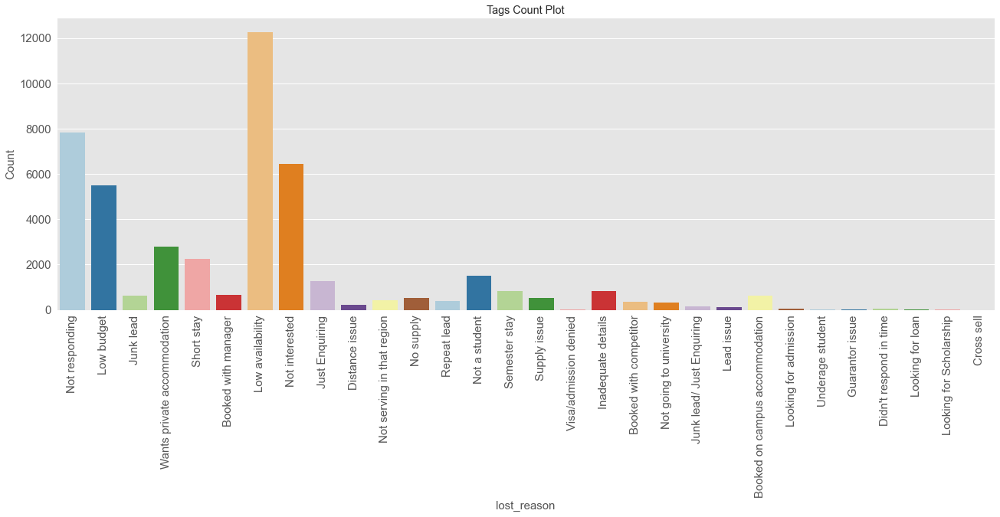

In [329]:
sns.catplot(data = cat_df, x = 'lost_reason', kind = 'count', palette = 'Paired', aspect = 3, height=6).set(title = 'Tags Count Plot')
plt.xticks(rotation = 'vertical')
plt.tick_params(labelsize=15)
plt.xlabel("lost_reason", size = 15)
plt.ylabel("Count", size = 15)
plt.show()

In [330]:

encoder = OrdinalEncoder()

In [331]:
encode_df = pd.DataFrame(encoder.fit_transform(cat_df), columns = cat_df.columns)
encode_df

,Agent_id,status,lost_reason,budget,lease,movein,source,source_city,source_country,utm_source,utm_medium,des_city,des_country,room_type,lead_id
0,12.0,2.0,21.0,1840.0,266.0,166.0,432.0,2626.0,110.0,5.0,10.0,206.0,8.0,0.0,24487.0
1,20.0,2.0,16.0,1840.0,266.0,166.0,432.0,2626.0,110.0,5.0,10.0,74.0,8.0,0.0,22098.0
2,87.0,2.0,21.0,1758.0,266.0,471.0,343.0,2630.0,167.0,26.0,3.0,18.0,8.0,0.0,17972.0
3,110.0,2.0,16.0,10.0,2.0,166.0,508.0,2830.0,167.0,26.0,3.0,26.0,8.0,0.0,3592.0
4,12.0,2.0,8.0,1840.0,266.0,166.0,432.0,2626.0,110.0,5.0,10.0,137.0,10.0,0.0,30099.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46603,15.0,2.0,15.0,1840.0,263.0,19.0,432.0,2133.0,101.0,26.0,3.0,22.0,8.0,3.0,3303.0
46604,24.0,2.0,24.0,1840.0,286.0,438.0,432.0,2707.0,101.0,26.0,3.0,135.0,8.0,3.0,3905.0
46605,5.0,2.0,15.0,1816.0,266.0,313.0,343.0,2133.0,101.0,26.0,3.0,206.0,8.0,3.0,26007.0
46606,60.0,2.0,15.0,817.0,93.0,456.0,579.0,3961.0,135.0,19.0,50.0,206.0,8.0,0.0,3905.0


In [332]:
df

,Unnamed: 0,Agent_id,status,lost_reason,budget,lease,movein,source,source_city,source_country,utm_source,utm_medium,des_city,des_country,room_type,lead_id
0,0,1deba9e96f404694373de9749ddd1ca8aa7bb823145a6f...,LOST,Not responding,NaN,NaN,NaN,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,3d59f7548e1af2151b64135003ce63c0a484c26b9b8b16...,268ad70eb5bc4737a2ae28162cbca30118cc94520e49ef...,ecc0e7dc084f141b29479058967d0bc07dee25d9690a98...,8d23a6e37e0a6431a8f1b43a91026dcff51170a89a6512...,NaN,cd5dc0d9393f3980d11d4ba6f88f8110c2b7a7f7796307...
1,1,299ae77a4ef350ae0dd37d6bba1c002d03444fb1edb236...,LOST,Low budget,NaN,NaN,NaN,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,3d59f7548e1af2151b64135003ce63c0a484c26b9b8b16...,268ad70eb5bc4737a2ae28162cbca30118cc94520e49ef...,5372372f3bf5896820cb2819300c3e681820d82c6efc54...,8d23a6e37e0a6431a8f1b43a91026dcff51170a89a6512...,NaN,b94693673a5f7178d1b114e4004ad52377d3244dd24a3d...
2,2,c213697430c006013012dd2aca82dd9732aa0a1a6bca13...,LOST,Not responding,£121 - £180 Per Week,Full Year Course Stay 40 - 44 weeks,31/08/22,7aae3e886e89fc1187a5c47d6cea1c22998ee610ade1f2...,9b8cc3c63cdf447e463c11544924bf027945cbd29675f7...,e09e10e67812e9d236ad900e5d46b4308fc62f5d69446a...,bbdefa2950f49882f295b1285d4fa9dec45fc4144bfb07...,09076eb7665d1fb9389c7c4517fee0b00e43092eb34821...,11ab03a1a8c367191355c152f39fe28cae5e426fce49ef...,8d23a6e37e0a6431a8f1b43a91026dcff51170a89a6512...,Ensuite,96ea4e2bf04496c044745938c0299c264c3f4ba079e572...
3,3,eac9815a500f908736d303e23aa227f0957177b0e6756b...,LOST,Low budget,0-0,0,NaN,ba2d0a29556ac20f86f45e4543c0825428cba33fd7a9ea...,a5f0d2d08eb0592087e3a3a2f9c1ba2c67cc30f2efd2bd...,e09e10e67812e9d236ad900e5d46b4308fc62f5d69446a...,bbdefa2950f49882f295b1285d4fa9dec45fc4144bfb07...,09076eb7665d1fb9389c7c4517fee0b00e43092eb34821...,19372fa44c57a01c37a5a8418779ca3d99b0b59731fb35...,8d23a6e37e0a6431a8f1b43a91026dcff51170a89a6512...,NaN,1d2b34d8add02a182a4129023766ca4585a8ddced0e5b3...
4,4,1deba9e96f404694373de9749ddd1ca8aa7bb823145a6f...,LOST,Junk lead,NaN,NaN,NaN,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,3d59f7548e1af2151b64135003ce63c0a484c26b9b8b16...,268ad70eb5bc4737a2ae28162cbca30118cc94520e49ef...,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,NaN,fc10fffd29cfbe93c55158fb47752a7501c211d253468c...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46603,46603,2306878a9ad9b57686cd623dd285aaa9b25afdf627f651...,LOST,Low availability,£60 - £120 Per week,Complete Education Year Stay 50 - 52 weeks,01/09/22,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,7d1550b844ff586a6023216c06263105eed0a849a2a1f6...,8da82000ef9c4468ba47362a924b895e40662fed846942...,bbdefa2950f49882f295b1285d4fa9dec45fc4144bfb07...,09076eb7665d1fb9389c7c4517fee0b00e43092eb34821...,13d4b96b6ee361b737e22404aeecca45f322ba7d4c2c42...,8d23a6e37e0a6431a8f1b43a91026dcff51170a89a6512...,Studio,1aaa4a4a9092e4c0eabf958ed9aea59c50d8ea3f08f691...
46604,46604,327ec29056cc47c24bf922f7dc0f78261dad5c726d7353...,LOST,Semester stay,£60 - £120 Per week,Summer/Short Stay 8 - 12 weeks,29/09/22,9b2d5b4678781e53038e91ea5324530a03f27dc1d0e5f6...,9f2ba6981e36ea0fca6c16f42e6413d788d2a7499b8b7f...,8da82000ef9c4468ba47362a924b895e40662fed846942...,bbdefa2950f49882f295b1285d4fa9dec45fc4144bfb07...,09076eb7665d1fb9389c7c4517fee0b00e43092eb34821...,998c18dc0e513ab0035c7b858e3780bbbead88695a15de...,8d23a6e37e0a6431a8f1b43a91026dcff51170a89a6512...,Studio,1f90dbad4873cb9673ff3c7ec69fbac4289181453c6cea...
46605,46605,1134c0a7d44fdae1afd7f1f64e2789496784095ca0a050...,LOST,Low availability,£241 - £300 Per week,Full Year Course Stay 40 - 44 weeks,20/09/22,7aae3e886e89fc1187a5c47

In [333]:
knn_imputer = KNN(k = 6)

In [334]:
#impute_data = knn_imputer.fit_transform(encode_df)
final_df = pd.concat([num_df, encode_df], axis = 1)
final_df.head(5)

,Unnamed: 0,Agent_id,status,lost_reason,budget,lease,movein,source,source_city,source_country,utm_source,utm_medium,des_city,des_country,room_type,lead_id
0,0,12.0,2.0,21.0,1840.0,266.0,166.0,432.0,2626.0,110.0,5.0,10.0,206.0,8.0,0.0,24487.0
1,1,20.0,2.0,16.0,1840.0,266.0,166.0,432.0,2626.0,110.0,5.0,10.0,74.0,8.0,0.0,22098.0
2,2,87.0,2.0,21.0,1758.0,266.0,471.0,343.0,2630.0,167.0,26.0,3.0,18.0,8.0,0.0,17972.0
3,3,110.0,2.0,16.0,10.0,2.0,166.0,508.0,2830.0,167.0,26.0,3.0,26.0,8.0,0.0,3592.0
4,4,12.0,2.0,8.0,1840.0,266.0,166.0,432.0,2626.0,110.0,5.0,10.0,137.0,10.0,0.0,30099.0


In [335]:
data2 = final_df.copy()
data2.dropna(axis=0, inplace=True)


In [336]:
data2=final_df
def binary_map(q):
    return q.map({'yes':1,'no':0})

In [337]:
import plotly.express as px
fig = px.scatter(x=data2['room_type'], y=data2['status'])
fig


In [338]:
fig = px.scatter(x=data2['budget'], y=data2['status'])
fig

In [339]:
fig = px.scatter(x=data2['lost_reason'], y=data2['status'])

fig


In [340]:
fig = px.scatter(x=data2['lease'], y=data2['status'])
fig

In [341]:
fig = px.scatter(x=data2['lead_id'], y=data2['status'])

fig

In [342]:
fig = px.scatter(x=data2['movein'], y=data2['status'])

fig


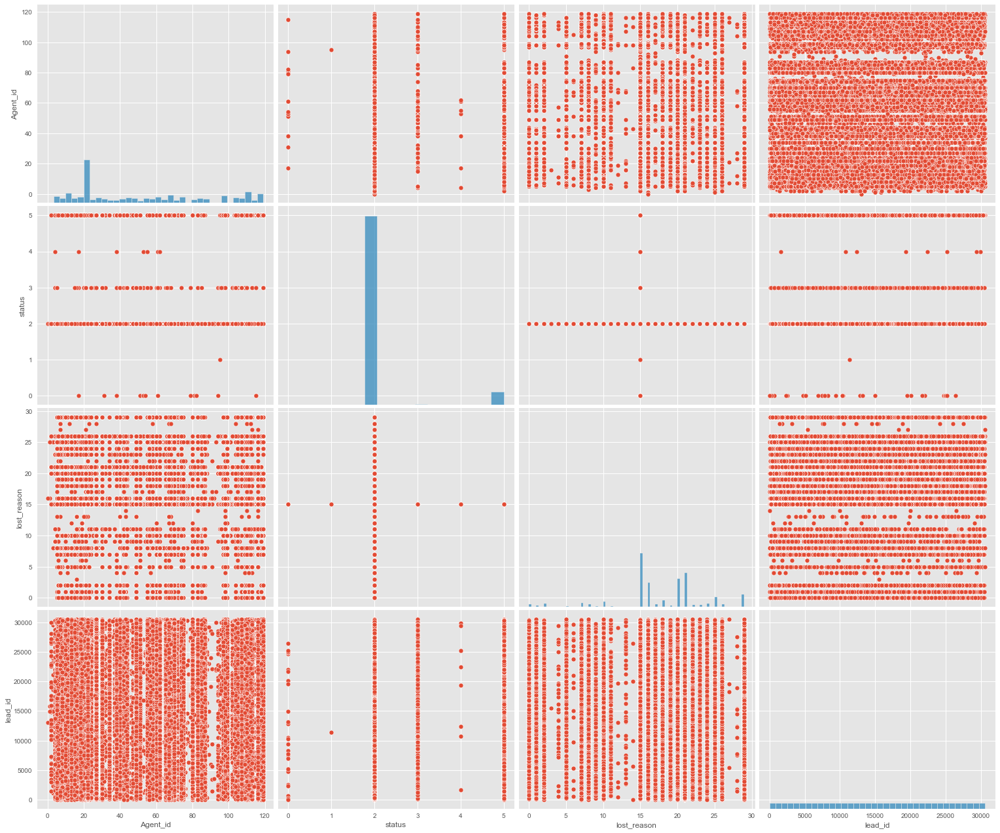

In [343]:
sns.pairplot(final_df.iloc[:, [1,2,3,-1]], palette = 'gist_heat', height = 4.5, aspect = 1.2)

# Outliers Detection

In [344]:

def check_outlier(data, col):
    
    #calculating quartile deviation
    q1 = np.quantile(data[col], q = 0.25)
    q3 = np.quantile(data[col], q = 0.75)
    
    #calculating inter-quartile range
    iqr = q3-q1
    
    #calculating lower and upper bound
    lower_bound = q1 - 1.5*iqr
    upper_bound = q3 + 1.5*iqr
    
    #filtering data with outliers
    outlier = data[col][(data[col] < lower_bound) | (data[col] > upper_bound)]
    plt.figure(figsize=(14,8))
    plt.subplot(211)
    plt.title("%s with Outliers" %(col))
    plt.plot(data[col])
    sns.scatterplot(data = outlier, x = outlier.index, y = outlier.values, marker = 'X', color = 'k', s=70)
    plt.subplot(212)
    sns.boxplot(data = data, x = col, color = 'g')
    check_outlier(data, col)
plt.show()
    


In [345]:
q1 = np.quantile(final_df.budget, q = 0.25)
q3 = np.quantile(final_df.budget, q = 0.75)
    
    #calculating inter-quartile range
iqr = q3-q1
    
    #calculating lower and upper bound
lower_bound = q1 - 1.5*iqr
upper_bound = q3 + 1.5*iqr


In [346]:
outlier =final_df.budget [(final_df.budget < lower_bound) | (final_df.budget > upper_bound)]
outlier

Series([], Name: budget, dtype: float64)

<AxesSubplot:>

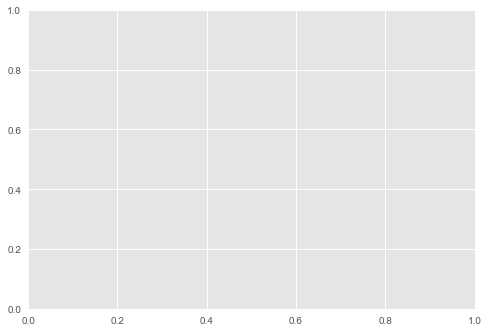

In [347]:
sns.scatterplot(data = outlier, x = outlier.index, y = outlier.values, marker = 'X', color = 'k', s=70)

In [348]:

q1 = np.quantile(final_df.budget, q=0.25)
q3 = np.quantile(final_df.budget, q=0.75)
iqr = q3 - q1

lower_bound = q1 - 1.5*iqr
upper_bound = q3 + 1.5*iqr


outliers =final_df.budget[(final_df.budget< lower_bound) | (final_df.budget> upper_bound)]

if not outliers.empty:
   
    fig, ax = plt.subplots()
    sns.scatterplot(data=final_df, x=final_df.index, y=budget, color='blue', ax=ax)
    sns.scatterplot(data=outliers, x=outliers.index, y=outliers, marker='X', color='k', s=70, ax=ax)
    plt.show()
else:
    print("No outliers found in column",final_df.budget)

No outliers found in column 0        1840.0
1        1840.0
2        1758.0
3          10.0
4        1840.0
          ...  
46603    1840.0
46604    1840.0
46605    1816.0
46606     817.0
46607    1799.0
Name: budget, Length: 46608, dtype: float64


<Figure size 1080x648 with 0 Axes>

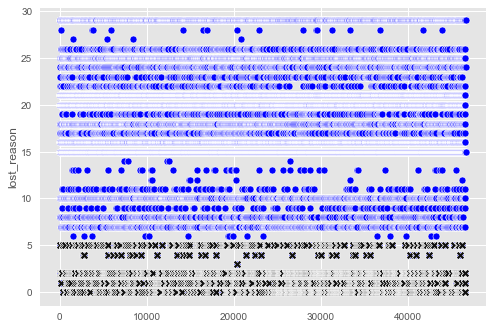

In [349]:
q1 = np.quantile(final_df.lost_reason, q=0.25)
q3 = np.quantile(final_df.lost_reason, q=0.75)
iqr = q3 - q1


lower_bound = q1 - 1.5*iqr
upper_bound = q3 + 1.5*iqr

# Identify outliers
outliers =final_df.lost_reason[(final_df.lost_reason< lower_bound) | (final_df.lost_reason> upper_bound)]


if not outliers.empty:
    
    plt.figure(figsize=(15,9))
    fig, ax = plt.subplots()
    sns.scatterplot(data=final_df, x=final_df.index, y=final_df.lost_reason, color='blue', ax=ax)
    sns.scatterplot(data=outliers, x=outliers.index, y=outliers, marker='X', color='k', s=70, ax=ax)
    plt.show()
else:
    print("No outliers found in column",final_df.lost_reason)

In [350]:
final_df.describe(percentiles = [0.01, 0.1, 0.25, 0.75, 0.90, 0.95, 0.99]).T

,count,mean,std,min,1%,10%,25%,50%,75%,90%,95%,99%,max
Unnamed: 0,46608.0,23303.500000,13454.715010,0.0,466.07,4660.7,11651.75,23303.5,34955.25,41946.3,44276.65,46140.93,46607.0
Agent_id,46608.0,52.448056,35.941921,0.0,5.00,13.0,22.00,43.0,83.00,110.0,113.00,119.00,119.0
status,46608.0,2.202369,0.749010,0.0,2.00,2.0,2.00,2.0,2.00,2.0,5.00,5.00,5.0
lost_reason,46608.0,17.751695,5.749547,0.0,0.00,10.0,15.00,18.0,21.00,25.0,29.00,29.00,29.0
budget,46608.0,1319.070524,651.815615,0.0,10.00,10.0,928.00,1758.0,1840.00,1840.0,1840.00,1840.00,1856.0
lease,46608.0,212.222001,102.816272,0.0,2.00,2.0,197.00,266.0,266.00,298.0,300.00,306.00,310.0
movein,46608.0,213.464191,119.768404,0.0,16.00,52.0,166.00,166.0,284.00,407.0,471.00,471.00,476.0
source,46608.0,380.857342,118.872246,0.0,64.00,343.0,343.00,343.0,433.00,508.0,579.00,637.00,682.0
source_city,46608.0,2359.249013,1107.619008,0.0,51.00,664.0,1564.00,2626.0,3058.00,4014.0,4014.00,4243.00,4335.0
source_country,46608.0,131.246481,43.671223,0.0,1.00,87.0,101.00,154.0,167.00,167.0,172.00,181.00,185.0


In [351]:
anomaly_data = final_df
anomaly_data

,Unnamed: 0,Agent_id,status,lost_reason,budget,lease,movein,source,source_city,source_country,utm_source,utm_medium,des_city,des_country,room_type,lead_id
0,0,12.0,2.0,21.0,1840.0,266.0,166.0,432.0,2626.0,110.0,5.0,10.0,206.0,8.0,0.0,24487.0
1,1,20.0,2.0,16.0,1840.0,266.0,166.0,432.0,2626.0,110.0,5.0,10.0,74.0,8.0,0.0,22098.0
2,2,87.0,2.0,21.0,1758.0,266.0,471.0,343.0,2630.0,167.0,26.0,3.0,18.0,8.0,0.0,17972.0
3,3,110.0,2.0,16.0,10.0,2.0,166.0,508.0,2830.0,167.0,26.0,3.0,26.0,8.0,0.0,3592.0
4,4,12.0,2.0,8.0,1840.0,266.0,166.0,432.0,2626.0,110.0,5.0,10.0,137.0,10.0,0.0,30099.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46603,46603,15.0,2.0,15.0,1840.0,263.0,19.0,432.0,2133.0,101.0,26.0,3.0,22.0,8.0,3.0,3303.0
46604,46604,24.0,2.0,24.0,1840.0,286.0,438.0,432.0,2707.0,101.0,26.0,3.0,135.0,8.0,3.0,3905.0
46605,46605,5.0,2.0,15.0,1816.0,266.0,313.0,343.0,2133.0,101.0,26.0,3.0,206.0,8.0,3.0,26007.0
46606,46606,60.0,2.0,15.0,817.0,93.0,456.0,579.0,3961.0,135.0,19.0,50.0,206.0,8.0,0.0,3905.0


In [352]:
anomaly_data = final_df.iloc[:, [3,4,5,6,14]]
anomaly_data

,lost_reason,budget,lease,movein,room_type
0,21.0,1840.0,266.0,166.0,0.0
1,16.0,1840.0,266.0,166.0,0.0
2,21.0,1758.0,266.0,471.0,0.0
3,16.0,10.0,2.0,166.0,0.0
4,8.0,1840.0,266.0,166.0,0.0
...,...,...,...,...,...
46603,15.0,1840.0,263.0,19.0,3.0
46604,24.0,1840.0,286.0,438.0,3.0
46605,15.0,1816.0,266.0,313.0,3.0
46606,15.0,817.0,93.0,456.0,0.0


In [353]:
y = final_df.iloc[:, 2]
y

0        2.0
1        2.0
2        2.0
3        2.0
4        2.0
        ... 
46603    2.0
46604    2.0
46605    2.0
46606    2.0
46607    2.0
Name: status, Length: 46608, dtype: float64

In [354]:
se = StandardScaler()


In [355]:
le = LogisticRegression(random_state = 42)

In [356]:
scaled_df = pd.DataFrame(se.fit_transform(anomaly_data), columns = anomaly_data.columns)



In [357]:
contamination = [0.1,0.01,0.001,0.05,0.005,0.0001]
k_neighbor = [3,5,7,9, 12, 15, 18, 21, 25]

In [358]:
lof_params = list(product(contamination, k_neighbor))

In [359]:
scores = []

In [360]:
for c, k in lof_params:
    lof = LocalOutlierFactor(n_neighbors=k, contamination=c, n_jobs = -1)
    predict = lof.fit_predict(scaled_df)
    mask = pd.DataFrame(predict)
    mask.columns = ["anomaly"]
    filter_df = pd.concat([scaled_df,mask ], axis = 1).query('anomaly == 1').reset_index().drop("index", axis = 1)
    filter_y = pd.concat([y, mask], axis = 1).query('anomaly == 1').reset_index().drop("index", axis = 1)
    ilter_df = filter_df.iloc[:, :3]
    filter_y = filter_y.iloc[:, :1]
    cv_score = cross_val_score(estimator= le, X = filter_df, y = filter_y, cv = 10, scoring = 'accuracy')
    scores.append(np.mean(cv_score))
    print(np.mean(cv_score))

0.9308191110178967
0.9308651385173097
0.931246579056408
0.9295778065378603
0.9287740466827481
0.9297208453190693
0.9303423302373617
0.9294126065785564
0.9298400405142029
0.9277680346357429
0.9278082438816151
0.927634858532677
0.9275048242172185
0.9275296438696868
0.9275048242172185
0.9274614778799839
0.9274831510486011
0.9274445244371435
0.9277721727702524
0.9278580788112638
0.9278366011480335
0.927815128096713
0.9277936504334827
0.9277952046470339
0.9277721727702524
0.9277721727702524
0.9277721727702524
0.9281794151801922
0.9274681652890135
0.9279987416055171
0.9279649526005308
0.9273454151038762
0.9276229664343759
0.9277407690912914
0.9281988752377929
0.9290376516444931
0.927696561666324
0.9278259417217363
0.9277612447193642
0.9277396837016841
0.9277012346925841
0.9276103036462716
0.9275887379788144
0.9276165482972841
0.9276103036462716
0.9278158134386972
0.9278158134386972
0.9278158134386972
0.9278158134386972
0.9278158134386972
0.9278158134386972
0.9278158134386972
0.92781581343869

In [361]:
param_df = pd.DataFrame(lof_params, columns = ["contamination", "neighbors"])


In [362]:
scores_df = pd.DataFrame(scores, columns = ["scores"])

In [363]:
lof_perf_df = pd.concat([param_df, scores_df], axis = 1)

In [364]:
lof_pivot = pd.pivot_table(data = lof_perf_df, index = 'contamination', columns = 'neighbors', values = 'scores')

<AxesSubplot:xlabel='neighbors', ylabel='contamination'>

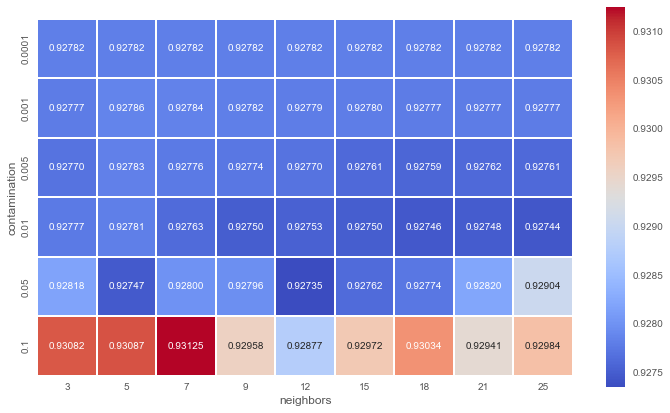

In [365]:

plt.figure(figsize=(12,7))
sns.heatmap(lof_pivot, annot = True, fmt = ".5f", cmap = 'coolwarm', square = True, linewidths=0.025)

In [366]:
lof = LocalOutlierFactor(contamination=0.001, n_neighbors=21, n_jobs = -1)
lof_fit = lof.fit_predict(scaled_df)
                         

In [367]:
anomaly_label = pd.DataFrame(lof_fit, columns = ["anomaly"])
anomaly_label

,anomaly
0,1
1,1
2,1
3,1
4,1
...,...
46603,1
46604,1
46605,1
46606,1


In [368]:
final_df.loc[:, "anomaly"] = anomaly_label


In [369]:

final_df.head()


,Unnamed: 0,Agent_id,status,lost_reason,budget,lease,movein,source,source_city,source_country,utm_source,utm_medium,des_city,des_country,room_type,lead_id,anomaly
0,0,12.0,2.0,21.0,1840.0,266.0,166.0,432.0,2626.0,110.0,5.0,10.0,206.0,8.0,0.0,24487.0,1
1,1,20.0,2.0,16.0,1840.0,266.0,166.0,432.0,2626.0,110.0,5.0,10.0,74.0,8.0,0.0,22098.0,1
2,2,87.0,2.0,21.0,1758.0,266.0,471.0,343.0,2630.0,167.0,26.0,3.0,18.0,8.0,0.0,17972.0,1
3,3,110.0,2.0,16.0,10.0,2.0,166.0,508.0,2830.0,167.0,26.0,3.0,26.0,8.0,0.0,3592.0,1
4,4,12.0,2.0,8.0,1840.0,266.0,166.0,432.0,2626.0,110.0,5.0,10.0,137.0,10.0,0.0,30099.0,1


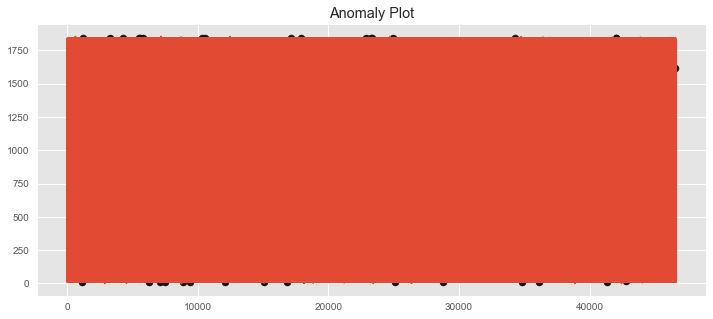

In [370]:
plt.figure(figsize=(12,5))
plt.title("Anomaly Plot")
plt.plot(final_df["budget"])
plt.scatter(x = final_df[final_df["anomaly"] == -1]["budget"].index, y = final_df[final_df["anomaly"] == -1]["budget"].values, color = 'k')


In [371]:
anomaly_idx = final_df[final_df["anomaly"] == -1].index
anomaly_idx

Int64Index([ 1143,  1213,  1710,  3266,  4245,  5290,  5537,  5552,  5596,
             5846,  6274,  7101,  7504,  8837,  9392, 10331, 10592, 12108,
            13846, 15070, 15129, 16810, 17129, 17294, 17939, 22907, 22921,
            23265, 23304, 24966, 25129, 25679, 26917, 28722, 28747, 28880,
            34304, 34834, 36116, 39000, 41164, 41347, 42053, 42060, 42816,
            46311, 46557],
           dtype='int64')

In [372]:
final_df.shape

(46608, 17)

In [373]:
filter_df.drop("anomaly", axis = 1, inplace = True)
filter_df = final_df.drop(anomaly_idx, axis = 0).reset_index().drop("index", axis = 1)
filter_df.iloc[:, :-1].describe()

,Unnamed: 0,Agent_id,status,lost_reason,budget,lease,movein,source,source_city,source_country,utm_source,utm_medium,des_city,des_country,room_type,lead_id
count,46561.000000,46561.000000,46561.000000,46561.000000,46561.000000,46561.000000,46561.000000,46561.000000,46561.000000,46561.000000,46561.000000,46561.000000,46561.000000,46561.000000,46561.000000,46561.000000
mean,23306.560748,52.434183,2.202509,17.753850,1319.307919,212.381242,213.459397,380.834497,2359.091128,131.252636,22.966410,10.839114,116.546487,7.987157,0.501514,15286.463779
std,13454.009801,35.941661,0.749249,5.743646,651.562052,102.708980,119.750778,118.844415,1107.900820,43.678880,6.938716,15.309346,65.971231,1.177250,1.035808,8832.275473
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,11657.000000,22.000000,2.000000,15.000000,930.000000,197.000000,166.000000,343.000000,1564.000000,101.000000,22.000000,3.000000,70.000000,8.000000,0.000000,7644.000000
50%,23309.000000,43.000000,2.000000,18.000000,1758.000000,266.000000,166.000000,343.000000,2626.000000,154.000000,26.000000,3.000000,117.000000,8.000000,0.000000,15266.000000
75%,34958.000000,83.000000,2.000000,21.000000,1840.000000,266.000000,284.000000,433.000000,3058.000000,167.000000,26.000000,10.000000,175.000000,8.000000,0.000000,22946.000000
max,46607.000000,119.000000,5.000000,29.000000,1856.000000,310.000000,476.000000,682.000000,4335.000000,185.000000,34.000000,63.000000,219.000000,14.000000,4.000000,30573.000000


In [374]:
x=filter_df.drop("status",axis=1)
x.shape

(46561, 16)

In [375]:
y=filter_df.status
y

0        2.0
1        2.0
2        2.0
3        2.0
4        2.0
        ... 
46556    2.0
46557    2.0
46558    2.0
46559    2.0
46560    2.0
Name: status, Length: 46561, dtype: float64

# Train_test_Split

In [376]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x, y,test_size=0.3,random_state=42)

In [377]:
x_train.shape

(32592, 16)

In [378]:
x_test.shape

(13969, 16)

In [379]:
y_train.shape

(32592,)

In [380]:
y_test.shape

(13969,)

In [381]:
13969+32592

46561

# Models Creation

In [382]:
!pip install lightgbm
!pip install catboost
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, ExtraTreesClassifier, BaggingClassifier, StackingClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

In [383]:
ct = ColumnTransformer([('se', StandardScaler(), ['budget','room_type','lease','movein','lead_id','lost_reason'])], remainder='passthrough')

In [384]:
from sklearn import metrics
from sklearn.metrics import recall_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

# Random Forest Classifier

In [385]:
model_rf=RandomForestClassifier(n_estimators=100, criterion='gini', random_state = 100,max_depth=6, min_samples_leaf=8)
model_rf.fit(x_train,y_train)
y_pred1=model_rf.predict(x_test)
model_rf.score(x_test,y_test)
print(metrics.classification_report(y_test, y_pred1))
print(metrics.confusion_matrix(y_test, y_pred1))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        11
         2.0       0.93      1.00      0.96     12945
         3.0       0.00      0.00      0.00        81
         4.0       0.00      0.00      0.00         2
         5.0       0.99      0.08      0.15       930

    accuracy                           0.93     13969
   macro avg       0.38      0.22      0.22     13969
weighted avg       0.93      0.93      0.90     13969

[[    0    11     0     0     0]
 [    0 12944     0     0     1]
 [    0    81     0     0     0]
 [    0     2     0     0     0]
 [    0   854     0     0    76]]


# Decision tree

In [386]:
from sklearn.tree import DecisionTreeClassifier
model_dt=DecisionTreeClassifier(criterion = "gini",random_state =42,max_depth=10, min_samples_leaf=4)
model_rf.fit(x_train,y_train)
y_pred2=model_rf.predict(x_test)
model_rf.score(x_test,y_test)
print(metrics.classification_report(y_test, y_pred2))
print(metrics.confusion_matrix(y_test, y_pred2))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        11
         2.0       0.93      1.00      0.96     12945
         3.0       0.00      0.00      0.00        81
         4.0       0.00      0.00      0.00         2
         5.0       0.99      0.08      0.15       930

    accuracy                           0.93     13969
   macro avg       0.38      0.22      0.22     13969
weighted avg       0.93      0.93      0.90     13969

[[    0    11     0     0     0]
 [    0 12944     0     0     1]
 [    0    81     0     0     0]
 [    0     2     0     0     0]
 [    0   854     0     0    76]]


# Catboost 

In [387]:
import catboost as cb
model=cb.CatBoostClassifier()
model.fit(x_train,y_train)
y_pred3= model.predict(x_test)
accuracy=accuracy_score(y_test,y_pred3)


Learning rate set to 0.094513
0:	learn: 1.4203078	total: 35.7ms	remaining: 35.7s
1:	learn: 1.1721743	total: 52.9ms	remaining: 26.4s
2:	learn: 1.0137019	total: 69.4ms	remaining: 23.1s
3:	learn: 0.8810091	total: 92.7ms	remaining: 23.1s
4:	learn: 0.7687485	total: 109ms	remaining: 21.8s
5:	learn: 0.6816378	total: 126ms	remaining: 20.9s
6:	learn: 0.6089745	total: 143ms	remaining: 20.3s
7:	learn: 0.5541514	total: 160ms	remaining: 19.9s
8:	learn: 0.5006437	total: 179ms	remaining: 19.7s
9:	learn: 0.4590240	total: 197ms	remaining: 19.5s
10:	learn: 0.4154305	total: 215ms	remaining: 19.3s
11:	learn: 0.3840963	total: 233ms	remaining: 19.1s
12:	learn: 0.3516677	total: 250ms	remaining: 19s
13:	learn: 0.3268271	total: 268ms	remaining: 18.9s
14:	learn: 0.3035559	total: 289ms	remaining: 19s
15:	learn: 0.2855379	total: 306ms	remaining: 18.8s
16:	learn: 0.2631773	total: 323ms	remaining: 18.7s
17:	learn: 0.2461136	total: 340ms	remaining: 18.5s
18:	learn: 0.2284422	total: 357ms	remaining: 18.5s
19:	learn: 

# Adaboost Classifier

In [388]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# generate some random data for classification
X, y = make_classification(n_samples=1000, n_features=10, n_informative=5, n_classes=2, random_state=42)



# initialize base estimator
base_estimator = DecisionTreeClassifier(max_depth=1)

# initialize AdaBoost classifier
ada = AdaBoostClassifier(base_estimator=base_estimator, n_estimators=50, random_state=42)

# fit the AdaBoost classifier to the training data
ada.fit(x_train, y_train)

# make predictions on the test data
y_pred4 = ada.predict(x_test)

# calculate accuracy score of the classifier
accuracy = accuracy_score(y_test, y_pred4)
print("Accuracy score: {:.2f}".format(accuracy))

Accuracy score: 0.85


In [389]:
print(metrics.classification_report(y_test, y_pred4))
print(metrics.confusion_matrix(y_test, y_pred4))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        11
         2.0       0.92      0.92      0.92     12945
         3.0       0.00      0.00      0.00        81
         4.0       0.00      0.00      0.00         2
         5.0       0.00      0.00      0.00       930

    accuracy                           0.85     13969
   macro avg       0.18      0.18      0.18     13969
weighted avg       0.86      0.85      0.86     13969

[[    0    11     0     0     0]
 [    0 11942     0  1003     0]
 [    0    78     0     3     0]
 [    0     2     0     0     0]
 [    0   906     0    24     0]]


# Bagging 

In [390]:
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Generate a random classification dataset
X, y = make_classification(n_samples=1000, n_features=10, n_classes=2, random_state=42)


# Instantiate a base classifier
base_classifier = DecisionTreeClassifier()

# Instantiate a bagging classifier
bagging_classifier = BaggingClassifier(base_estimator=base_classifier, n_estimators=10)

# Train the bagging classifier on the training data
bagging_classifier.fit(x_train, y_train)

# Make predictions on the testing data
y_pred5 = bagging_classifier.predict(x_test)

# Calculate the accuracy of the bagging classifier
accuracy = accuracy_score(y_test, y_pred5)

print("Bagging classifier accuracy:", accuracy)

Bagging classifier accuracy: 0.977020545493593


In [391]:
print(metrics.classification_report(y_test, y_pred5))
print(metrics.confusion_matrix(y_test, y_pred5))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        11
         2.0       0.99      0.99      0.99     12945
         3.0       0.52      0.16      0.25        81
         4.0       0.00      0.00      0.00         2
         5.0       0.81      0.89      0.85       930

    accuracy                           0.98     13969
   macro avg       0.46      0.41      0.42     13969
weighted avg       0.98      0.98      0.98     13969

[[    0     1     2     0     8]
 [    1 12811     3     0   130]
 [    0    14    13     1    53]
 [    0     0     1     0     1]
 [    0   100     6     0   824]]


# Gradient Boosting Classifier

In [392]:
from sklearn.ensemble import GradientBoostingClassifier

# Define the gradient boosting classifier
clf = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=42)

# Train the classifier on the training set
clf.fit(x_train, y_train)

# Make predictions on the testing set
y_pred6 = clf.predict(x_test)

# Evaluate the accuracy of the classifier
accuracy = accuracy_score(y_test, y_pred6)
print("Accuracy:", accuracy)

Accuracy: 0.9680721597823753


In [393]:
print(metrics.classification_report(y_test, y_pred6))
print(metrics.confusion_matrix(y_test, y_pred6))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        11
         2.0       0.99      0.98      0.99     12945
         3.0       0.00      0.00      0.00        81
         4.0       0.00      0.00      0.00         2
         5.0       0.81      0.90      0.85       930

    accuracy                           0.97     13969
   macro avg       0.36      0.38      0.37     13969
weighted avg       0.97      0.97      0.97     13969

[[    0     3     0     0     8]
 [  121 12689     0     0   135]
 [    8    18     0     0    55]
 [    0     0     0     0     2]
 [    1    95     0     0   834]]


## pychart

In [395]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.colors import ListedColormap
from scipy.stats import norm, boxcox
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from collections import Counter
from scipy import stats
from tqdm import tqdm_notebook
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder

In [396]:
import pycaret

In [397]:
pycaret.__version__

'2.2.0'

In [398]:
from pycaret.classification import *

In [399]:
from platform import python_version
print(python_version())

3.9.7


In [ ]:
final_df.columns

In [400]:
data=final_df[['Unnamed: 0', 'Agent_id', 'status', 'lost_reason', 'budget', 'lease',
       'movein', 'source', 'source_city', 'source_country', 'utm_source',
       'utm_medium', 'des_city', 'des_country', 'room_type', 'lead_id',
       'anomaly']]

In [401]:
k = setup(data = final_df, 
            target = "status",
            train_size = 0.8,
            fold = 5,
            session_id = 123,
            log_experiment = True, 
            experiment_name = 'grid_1', 
            silent = True,fold_shuffle=True,preprocess=False,
    imputation_type = 'iterative')

,Description,Value
0,session_id,123
1,Target,status
2,Target Type,Multiclass
3,Label Encoded,None
4,Original Data,"(46608, 17)"
5,Missing Values,False
6,Numeric Features,16
7,Categorical Features,0
8,Transformed Train Set,"(37286, 15)"
9,Transformed Test Set,"(9322, 15)"


# models comparision

In [402]:
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
catboost,CatBoost Classifier,0.9798,0.0000,0.4050,0.9791,0.9785,0.8528,0.8533,11.6700
gbc,Gradient Boosting Classifier,0.9774,0.0000,0.3935,0.9785,0.9768,0.8396,0.8409,8.5880
rf,Random Forest Classifier,0.9760,0.0000,0.3757,0.9748,0.9738,0.8162,0.8171,0.6560
dt,Decision Tree Classifier,0.9681,0.0000,0.3682,0.9686,0.9683,0.7643,0.7644,0.0660
lightgbm,Light Gradient Boosting Machine,0.9668,0.0000,0.3860,0.9707,0.9687,0.7629,0.7637,1.3020
et,Extra Trees Classifier,0.9545,0.0000,0.2789,0.9459,0.9451,0.5508,0.5960,0.6680
ada,Ada Boost Classifier,0.9311,0.0000,0.3397,0.9448,0.9357,0.5144,0.5272,0.5200
lr,Logistic Regression,0.9275,0.0000,0.1933,0.8603,0.8926,-0.0001,-0.0012,4.8460
ridge,Ridge Classifier,0.9275,0.0000,0.1933,0.8603,0.8927,0.0000,0.0000,0.0620
lda,Linear Discriminant Analysis,0.9275,0.0000,0.1933,0.8603,0.8927,0.0000,0.0000,0.0620


In [403]:
best_model = compare_models(sort='Recall')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
nb,Naive Bayes,0.8088,0.0000,0.4250,0.9423,0.8617,0.3121,0.3824,0.0480
catboost,CatBoost Classifier,0.9798,0.0000,0.4050,0.9791,0.9785,0.8528,0.8533,11.7220
gbc,Gradient Boosting Classifier,0.9774,0.0000,0.3935,0.9785,0.9768,0.8396,0.8409,8.4200
lightgbm,Light Gradient Boosting Machine,0.9668,0.0000,0.3860,0.9707,0.9687,0.7629,0.7637,1.0500
rf,Random Forest Classifier,0.9760,0.0000,0.3757,0.9748,0.9738,0.8162,0.8171,0.5840
dt,Decision Tree Classifier,0.9681,0.0000,0.3682,0.9686,0.9683,0.7643,0.7644,0.0500
xgboost,Extreme Gradient Boosting,0.7842,0.0000,0.3592,0.7838,0.7835,0.6847,0.6849,3.3660
ada,Ada Boost Classifier,0.9311,0.0000,0.3397,0.9448,0.9357,0.5144,0.5272,0.5080
et,Extra Trees Classifier,0.9545,0.0000,0.2789,0.9459,0.9451,0.5508,0.5960,0.6820
knn,K Neighbors Classifier,0.9236,0.0000,0.1956,0.8730,0.8927,0.0182,0.0344,0.1940


# Best Model

In [404]:
print(best_model)

GaussianNB(priors=None, var_smoothing=1e-09)


In [405]:
models()

,Name,Reference,Turbo
ID,,,
lr,Logistic Regression,sklearn.linear_model._logistic.LogisticRegression,True
knn,K Neighbors Classifier,sklearn.neighbors._classification.KNeighborsCl...,True
nb,Naive Bayes,sklearn.naive_bayes.GaussianNB,True
dt,Decision Tree Classifier,sklearn.tree._classes.DecisionTreeClassifier,True
svm,SVM - Linear Kernel,sklearn.linear_model._stochastic_gradient.SGDC...,True
rbfsvm,SVM - Radial Kernel,sklearn.svm._classes.SVC,False
gpc,Gaussian Process Classifier,sklearn.gaussian_process._gpc.GaussianProcessC...,False
mlp,MLP Classifier,pycaret.internal.tunable.TunableMLPClassifier,False
ridge,Ridge Classifier,sklearn.linear_model._ridge.RidgeClassifier,True


In [406]:
ct = create_model('nb')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8140,0.0000,0.3261,0.9428,0.8669,0.3122,0.3772
1,0.8176,0.0000,0.4414,0.9437,0.8654,0.3348,0.4093
2,0.7798,0.0000,0.4181,0.9417,0.8472,0.2631,0.3335
3,0.8167,0.0000,0.4891,0.9420,0.8654,0.3240,0.3934
4,0.8160,0.0000,0.4504,0.9412,0.8634,0.3263,0.3984
Mean,0.8088,0.0000,0.4250,0.9423,0.8617,0.3121,0.3824
SD,0.0146,0.0000,0.0545,0.0009,0.0073,0.0255,0.0265


In [408]:
print(ct)

GaussianNB(priors=None, var_smoothing=1e-09)


In [409]:
tuned_ct = tune_model(ct)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9275,0.0000,0.1667,0.8602,0.8926,0.0000,0.0000
1,0.9276,0.0000,0.2000,0.8604,0.8927,0.0000,0.0000
2,0.9276,0.0000,0.2000,0.8604,0.8927,0.0000,0.0000
3,0.9276,0.0000,0.2000,0.8604,0.8927,0.0000,0.0000
4,0.9275,0.0000,0.2000,0.8602,0.8925,0.0000,0.0000
Mean,0.9275,0.0000,0.1933,0.8603,0.8927,0.0000,0.0000
SD,0.0001,0.0000,0.0133,0.0001,0.0001,0.0000,0.0000


In [410]:
print(tuned_ct)

GaussianNB(priors=None, var_smoothing=0.002)


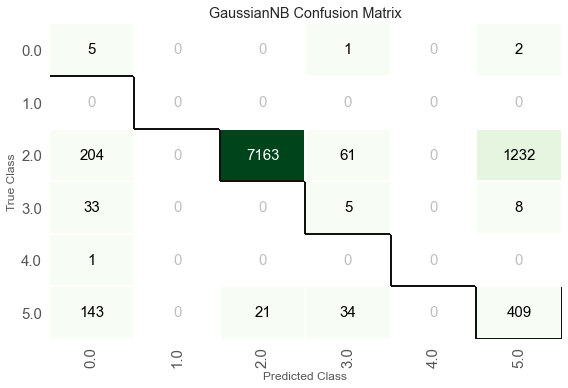

In [413]:
plot_model(best_model, plot = 'confusion_matrix')

In [414]:
def calculate_profit(y, y_pred):
    tp = np.where((y_pred==1) & (y==1), (120-15), 0)
    fp = np.where((y_pred==1) & (y==0), -15, 0)
    fn = np.where((y_pred==0) & (y==1), -120, 0)
    return np.sum([tp,fp,fn])
add_metric('profit', 'Profit', calculate_profit)

Name                                                            Profit
Display Name                                                    Profit
Score Function       <function calculate_profit at 0x000001ECE4FD34C0>
Scorer                                   make_scorer(calculate_profit)
Target                                                            pred
Args                                                                {}
Greater is Better                                                 True
Multiclass                                                        True
Custom                                                            True
Name: profit, dtype: object

In [415]:
best_model = compare_models(sort='Profit')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Profit,TT (Sec)
lr,Logistic Regression,0.9275,0.0000,0.1933,0.8603,0.8926,-0.0001,-0.0012,0.0000,2.9160
knn,K Neighbors Classifier,0.9236,0.0000,0.1956,0.8730,0.8927,0.0182,0.0344,0.0000,0.2340
nb,Naive Bayes,0.8088,0.0000,0.4250,0.9423,0.8617,0.3121,0.3824,0.0000,0.0480
dt,Decision Tree Classifier,0.9681,0.0000,0.3682,0.9686,0.9683,0.7643,0.7644,0.0000,0.0520
svm,SVM - Linear Kernel,0.9264,0.0000,0.1934,0.8644,0.8923,0.0003,0.0002,0.0000,0.7400
ridge,Ridge Classifier,0.9275,0.0000,0.1933,0.8603,0.8927,0.0000,0.0000,0.0000,0.0480
rf,Random Forest Classifier,0.9760,0.0000,0.3757,0.9748,0.9738,0.8162,0.8171,0.0000,0.6000
ada,Ada Boost Classifier,0.9311,0.0000,0.3397,0.9448,0.9357,0.5144,0.5272,0.0000,0.5020
gbc,Gradient Boosting Classifier,0.9774,0.0000,0.3935,0.9785,0.9768,0.8396,0.8409,0.0000,8.3160
lda,Linear Discriminant Analysis,0.9275,0.0000,0.1933,0.8603,0.8927,0.0000,0.0000,0.0000,0.0600


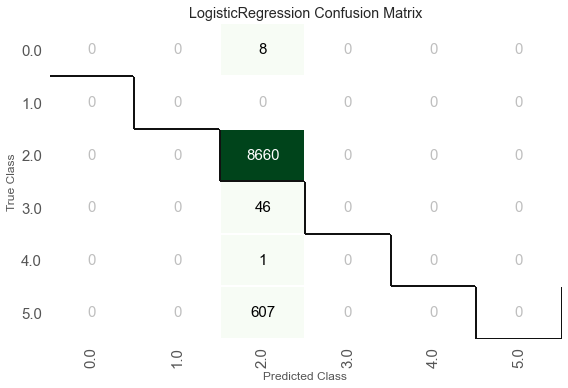

In [416]:
plot_model(best_model, plot = 'confusion_matrix')


data_new = data2.copy()
data_new.drop('status', axis=1, inplace=True)
predict_model(best_model, data=data_new)

In [417]:
from pycaret.utils import check_metric
check_metric(final_df['lost_reason'],final_df['status'],metric='Accuracy')*100

1.4500000000000002

In [418]:
df2 = final_df.assign(score=[0]*len(final_df))
df2

,Unnamed: 0,Agent_id,status,lost_reason,budget,lease,movein,source,source_city,source_country,utm_source,utm_medium,des_city,des_country,room_type,lead_id,anomaly,score
0,0,12.0,2.0,21.0,1840.0,266.0,166.0,432.0,2626.0,110.0,5.0,10.0,206.0,8.0,0.0,24487.0,1,0
1,1,20.0,2.0,16.0,1840.0,266.0,166.0,432.0,2626.0,110.0,5.0,10.0,74.0,8.0,0.0,22098.0,1,0
2,2,87.0,2.0,21.0,1758.0,266.0,471.0,343.0,2630.0,167.0,26.0,3.0,18.0,8.0,0.0,17972.0,1,0
3,3,110.0,2.0,16.0,10.0,2.0,166.0,508.0,2830.0,167.0,26.0,3.0,26.0,8.0,0.0,3592.0,1,0
4,4,12.0,2.0,8.0,1840.0,266.0,166.0,432.0,2626.0,110.0,5.0,10.0,137.0,10.0,0.0,30099.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46603,46603,15.0,2.0,15.0,1840.0,263.0,19.0,432.0,2133.0,101.0,26.0,3.0,22.0,8.0,3.0,3303.0,1,0
46604,46604,24.0,2.0,24.0,1840.0,286.0,438.0,432.0,2707.0,101.0,26.0,3.0,135.0,8.0,3.0,3905.0,1,0
46605,46605,5.0,2.0,15.0,1816.0,266.0,313.0,343.0,2133.0,101.0,26.0,3.0,206.0,8.0,3.0,26007.0,1,0
46606,46606,60.0,2.0,15.0,817.0,93.0,456.0,579.0,3961.0,135.0,19.0,50.0,206.0,8.0,0.0,3905.0,1,0


In [ ]:

df2=final_df.assign(score_1=[1]*len(final_df))
df2

In [ ]:
# Example value for conversion

df2 = final_df.assign(score=0, score_1=1, label=label*len(final_df))
df2

In [419]:
from pycaret.classification import *
clf1 = setup(data = final_df, target = 'status')

# create a model
xgboost = create_model('nb')

# predict on new data
new_data = final_df.copy()
new_data.drop('status', axis = 1, inplace = True)
predict_model(xgboost, raw_score = True, data = new_data,shuffle=False, random_state=42)

IntProgress(value=0, description='Processing: ', max=3)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,01:25:07
Status,. . . . . . . . . . . . . . . . . .,Preparing Data for Modeling


ValueError: Setting a random_state has no effect since shuffle is False. You should leave random_state to its default (None), or set shuffle=True.

In [425]:
from pycaret.classification import *
clf1 = setup(data = final_df, target = 'status')

# create a model
nb = create_model('nb')

# predict on new data
new_data1 = final_df.copy()
new_data1.drop('status', axis = 1, inplace = True)
predict_model(nb, raw_score = False, data = new_data1,shuffle=True)
predicted_data = predict_model(nb, raw_score=False, data=new_data1)



IntProgress(value=0, description='Processing: ', max=3)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,01:25:07
Status,. . . . . . . . . . . . . . . . . .,Preparing Data for Modeling


ValueError: Setting a random_state has no effect since shuffle is False. You should leave random_state to its default (None), or set shuffle=True.

In [421]:
final_df[final_df['Label']==0][['Score']].hist()

KeyError: 'Label'

In [423]:
predictions = predict_model(ct, data = final_df)
sample['status'] = predictions['Label']
sample.to_csv('Data_Science_Internship - Dump.csv',index=False)
sample.head()

AttributeError: 'DataTypes_Auto_infer' object has no attribute 'final_training_columns'

##The above are the last 3 sentence but it is not working 